# MANUAL NET ARCHITECTURE

In [1]:
import tensorflow
import tensorflow as tf
print(tf.__version__)

import os 
import glob
from PIL import Image
import matplotlib.pyplot as plt

from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Activation

2024-10-29 10:07:52.652392: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1730176672.676456   20965 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1730176672.683770   20965 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-29 10:07:52.710673: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2.18.0


In [4]:
COVID = 'Dataset/COVID'
NORMAL = 'Dataset/NORMAL'
PNEUMONIA = 'Dataset/PNEUMONIA'
TUBERCLOSIS = 'Dataset/TUBERCLOSIS'

In [6]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR COVID:

======== Images in:  Dataset/COVID
Images_count :	 200
Min_width :	 299
Max_width :	 299
Min_height :	 299
Max_height :	 299



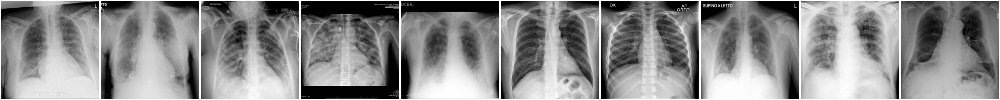

In [8]:
print("")
print("TRAINING DATA FOR COVID:")
print("")
images_details(COVID)
print("")
plot_images(COVID, 10) 


TRAINING DATA FOR NORMAL:

======== Images in:  Dataset/NORMAL
Images_count :	 200
Min_width :	 299
Max_width :	 299
Min_height :	 299
Max_height :	 299



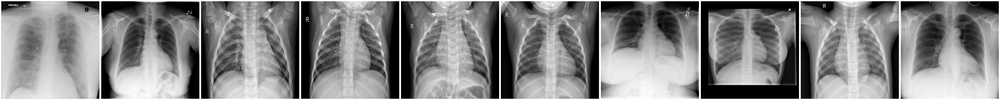

In [9]:
print("")
print("TRAINING DATA FOR NORMAL:")
print("")
images_details(NORMAL)
print("")
plot_images(NORMAL, 10)


TRAINING DATA FOR PNEUMONIA:

======== Images in:  Dataset/PNEUMONIA
Images_count :	 200
Min_width :	 299
Max_width :	 299
Min_height :	 299
Max_height :	 299



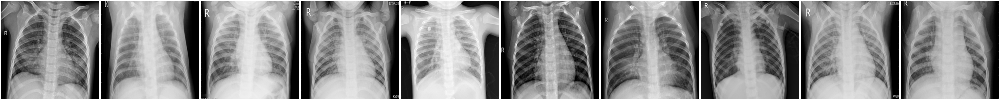

In [10]:
print("")
print("TRAINING DATA FOR PNEUMONIA:")
print("")
images_details(PNEUMONIA)
print("")
plot_images(PNEUMONIA, 10)


TRAINING DATA FOR TUBERCLOSIS:

======== Images in:  Dataset/TUBERCLOSIS
Images_count :	 200
Min_width :	 512
Max_width :	 2320
Min_height :	 512
Max_height :	 2828



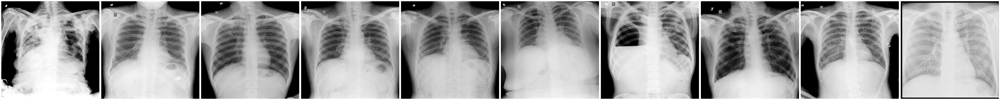

In [11]:
print("")
print("TRAINING DATA FOR TUBERCLOSIS:")
print("")
images_details(TUBERCLOSIS)
print("")
plot_images(TUBERCLOSIS, 10)

In [13]:
# Define the path to your dataset directory
dataset_dir = 'Dataset'

# Set the batch size and number of classes
batch_size = 64
num_classes = 4

In [14]:
# Create an ImageDataGenerator for data augmentation and preprocessing

from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    validation_split=0.2)

In [16]:
# Load and preprocess the dataset using the ImageDataGenerator

train_generator = datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training')

Found 640 images belonging to 4 classes.


In [22]:
validation_generator = datagen.flow_from_directory(
    dataset_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation')


Found 160 images belonging to 4 classes.


In [24]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


2024-10-29 10:08:12.471497: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [26]:
MODEL=Sequential()
MODEL.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
MODEL.add(MaxPooling2D(pool_size=(2,2)))
MODEL.add(Flatten())
MODEL.add(Dense(4, activation='softmax'))
MODEL.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

/home/sandy3o/anaconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [28]:
epochs = 10

In [30]:
history = MODEL.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs # Add the callbacks here
)

/home/sandy3o/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


2024-10-29 10:08:17.645782: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 403734528 exceeds 10% of free system memory.
2024-10-29 10:08:17.955153: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 403734528 exceeds 10% of free system memory.


 1/10 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - accuracy: 0.2344 - loss: 1.4027

2024-10-29 10:08:19.098868: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 403734528 exceeds 10% of free system memory.
2024-10-29 10:08:19.350129: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 403734528 exceeds 10% of free system memory.


 2/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.2461 - loss: 20.0484

2024-10-29 10:08:20.159959: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 403734528 exceeds 10% of free system memory.


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2634 - loss: 27.7475

/home/sandy3o/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.2666 - loss: 27.0746 - val_accuracy: 0.3375 - val_loss: 2.6202
Epoch 2/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.3678 - loss: 2.5392 - val_accuracy: 0.4062 - val_loss: 1.3249
Epoch 3/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.4088 - loss: 1.5678 - val_accuracy: 0.4437 - val_loss: 1.2193
Epoch 4/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.4934 - loss: 1.1445 - val_accuracy: 0.5938 - val_loss: 1.1933
Epoch 5/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5829 - loss: 1.0618 - val_accuracy: 0.7563 - val_loss: 0.8557
Epoch 6/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5546 - loss: 1.4463 - val_accuracy: 0.5688 - val_loss: 0.9958
Epoch 7/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.6646 - loss: 0.9195 - val_accuracy: 0.5500 - val_loss: 1.0330
Epoch 8/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5697 - loss: 1.0929 - val_accuracy: 0.5000 - val_loss: 2.0043
Ep

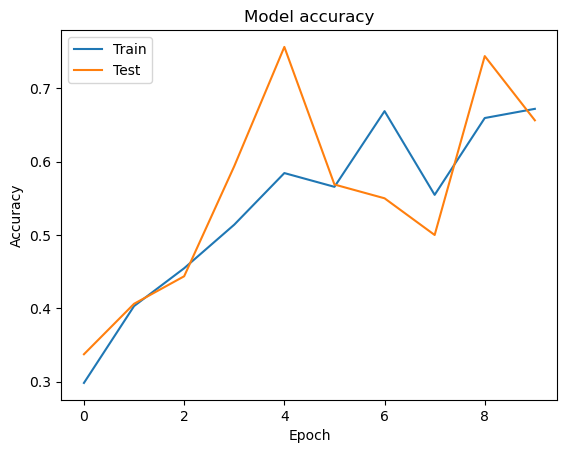

In [31]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

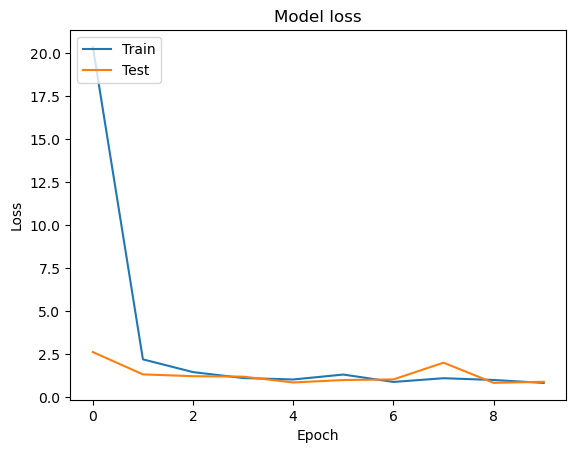

In [32]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()